## RCTD

In [44]:
library(spacexr)
library(Matrix)
library(ggplot2)
library(Seurat)

In [113]:
anterior1 <- readRDS('data/stxBrain/raw_anterior1.rds')

In [45]:
sc_ref <- readRDS('data/scData/sc_clean_newMarker.rds')

In [46]:
SP <- SpatialRNA(coords = anterior1@images$anterior1@coordinates[, c("imagecol","imagerow")],
                 counts = anterior1@assays$Spatial@counts)

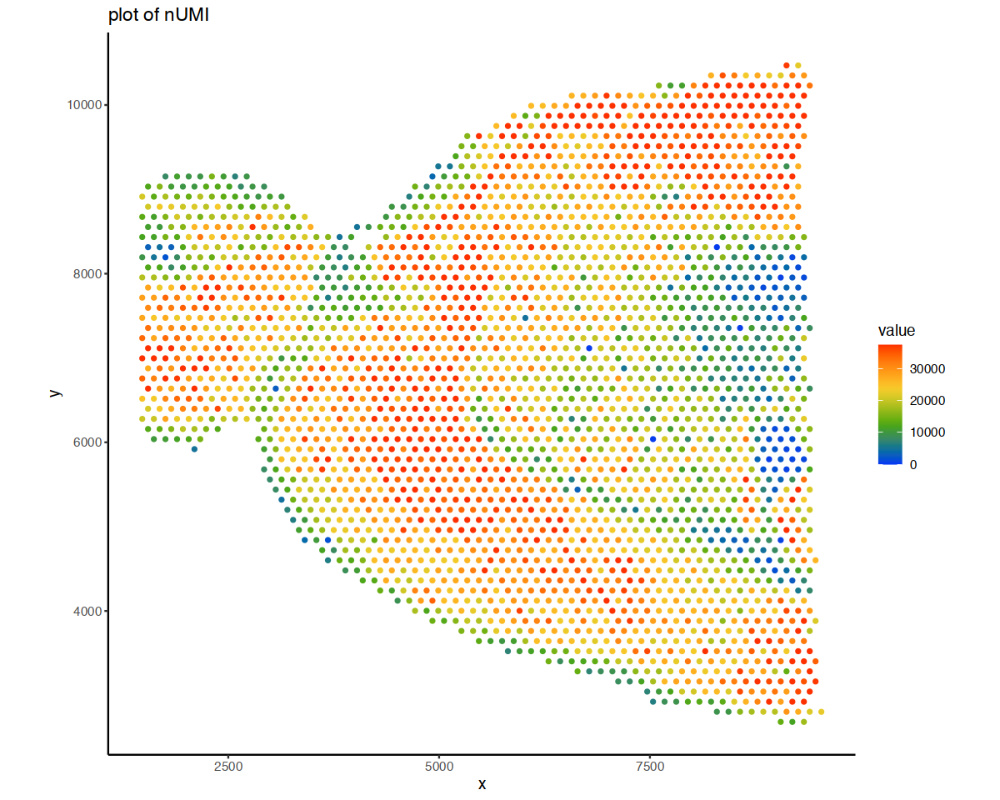

In [47]:
options(repr.plot.width=10, repr.plot.height=8)
plot_puck_continuous(puck=SP, barcodes=names(SP@nUMI), plot_val=SP@nUMI,
                     size=1, ylimit=c(0,round(quantile(SP@nUMI,0.9))),
                     title='plot of nUMI')

In [48]:
SC = Reference(counts = sc_ref@assays$RNA@counts, cell_types = sc_ref@active.ident, min_UMI= 50)

In [49]:
myRCTD <- create.RCTD(spatialRNA = SP, reference = SC, max_cores = 2)

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 7724

process_cell_type_info: number of genes in reference: 31053




       Ext_L25        Ext_L56     Ext_Thal_1       Ext_L5_1     Ext_Thal_2 
           317            309            256            210            187 
       Ext_L23        Oligo_2          Inh_1    Ext_Hpc_DG2          OPC_1 
           391           1931            357            260            166 
       Inh_Sst         Ext_L6    Inh_Meis2_2          Unk_1          Inh_3 
           124            144            124            189            149 
       Ext_Pir          Inh_4    Ext_Hpc_DG1      Inh_Lamp5      Astro_CTX 
           218            246             85             57            110 
   Inh_Meis2_3      Inh_Pvalb          Micro        Oligo_1          Inh_6 
           167            186            204             87            143 
     Ext_Amy_2 Astro_THAL_lat    Inh_Meis2_1  Astro_AMY_CTX        Ext_L6B 
           137             69             89             76             64 
      Ext_L5_2    Ext_Hpc_CA1        Inh_Vip Astro_THAL_med         LowQ_2 
           

End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Ext_L25 found DE genes: 110

get_de_genes: Ext_L56 found DE genes: 109

get_de_genes: Ext_Thal_1 found DE genes: 180

get_de_genes: Ext_L5_1 found DE genes: 67

get_de_genes: Ext_Thal_2 found DE genes: 120

get_de_genes: Ext_L23 found DE genes: 72

get_de_genes: Oligo_2 found DE genes: 349

get_de_genes: Inh_1 found DE genes: 37

get_de_genes: Ext_Hpc_DG2 found DE genes: 147

get_de_genes: OPC_1 found DE genes: 201

get_de_genes: Inh_Sst found DE genes: 90

get_de_genes: Ext_L6 found DE genes: 71

get_de_genes: Inh_Meis2_2 found DE genes: 120

get_de_genes: Unk_1 found DE genes: 61

get_de_genes: Inh_3 found DE genes: 42

get_de_genes: Ext_Pir found DE genes: 48

get_de_genes: Inh_4 found DE genes: 52

get_de_genes: Ext_Hpc_DG1 found DE genes: 159

get_de_genes: Inh_Lamp5 found DE genes: 129

get_de_genes: Astro_CTX found DE genes: 295

get_de_genes: Inh_Meis2_3 found DE genes: 

In [75]:
myRCTD <- run.RCTD(myRCTD, doublet_mode = "doublet")

fitBulk: decomposing bulk

chooseSigma: using initial Q_mat with sigma =  1

Likelihood value: 2797135.17211077



In [51]:
myRCTD <- readRDS('data/result/resultRCTD.rds')

In [53]:
#saveRDS(myRCTD, 'data//result/resultRCTD.rds')
normalized_weights <- normalize_weights(myRCTD@results$weights)

In [59]:
barcodes = colnames(myRCTD@spatialRNA@counts)
cell_type_names = colnames(normalized_weights)

In [63]:
cell_type_names

[1] "Ext_L25"        "Ext_L56"        "Ext_Thal_1"     "Ext_L5_1"      
 [5] "Ext_Thal_2"     "Ext_L23"        "Oligo_2"        "Inh_1"         
 [9] "Ext_Hpc_DG2"    "OPC_1"          "Inh_Sst"        "Ext_L6"        
[13] "Inh_Meis2_2"    "Inh_3"          "Ext_Pir"        "Inh_4"         
[17] "Ext_Hpc_DG1"    "Inh_Lamp5"      "Astro_CTX"      "Inh_Meis2_3"   
[21] "Inh_Pvalb"      "Micro"          "Oligo_1"        "Inh_6"         
[25] "Ext_Amy_2"      "Astro_THAL_lat" "Inh_Meis2_1"    "Astro_AMY_CTX" 
[29] "Ext_L6B"        "Ext_L5_2"       "Ext_Hpc_CA1"    "Inh_Vip"       
[33] "Astro_THAL_med" "LowQ_2"         "Astro_HYPO"     "Inh_2"         
[37] "Ext_Hpc_CA3"

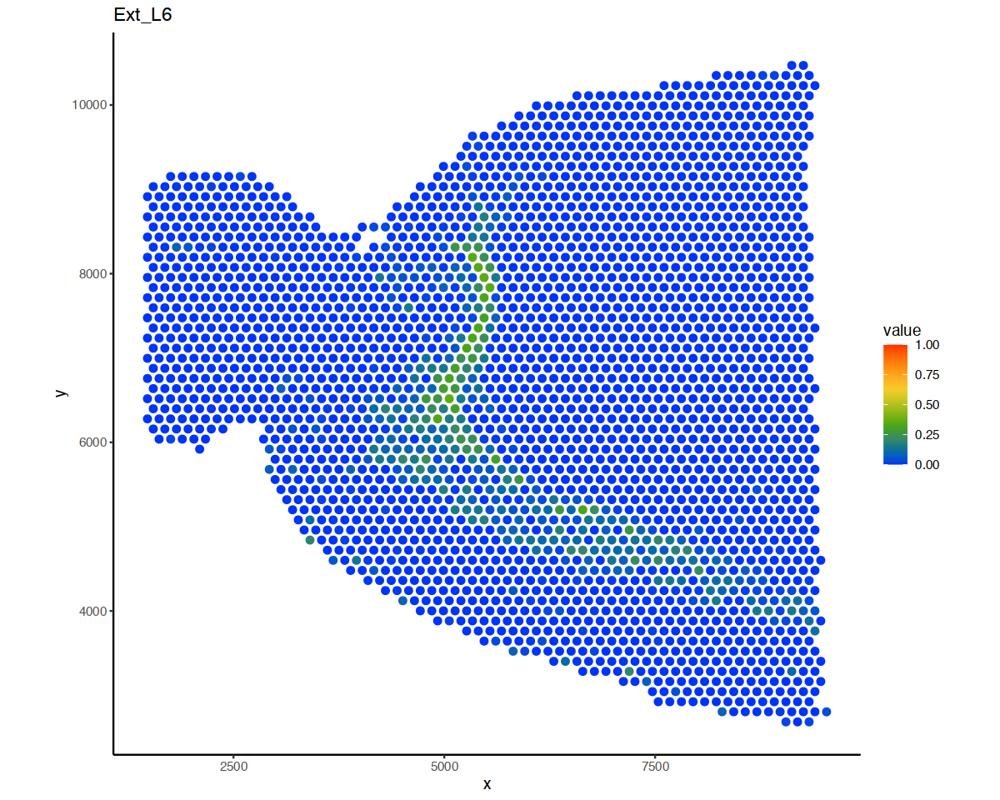

In [70]:
plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,"Astro_HYPO"], title ="Astro_HYPO", size=2)

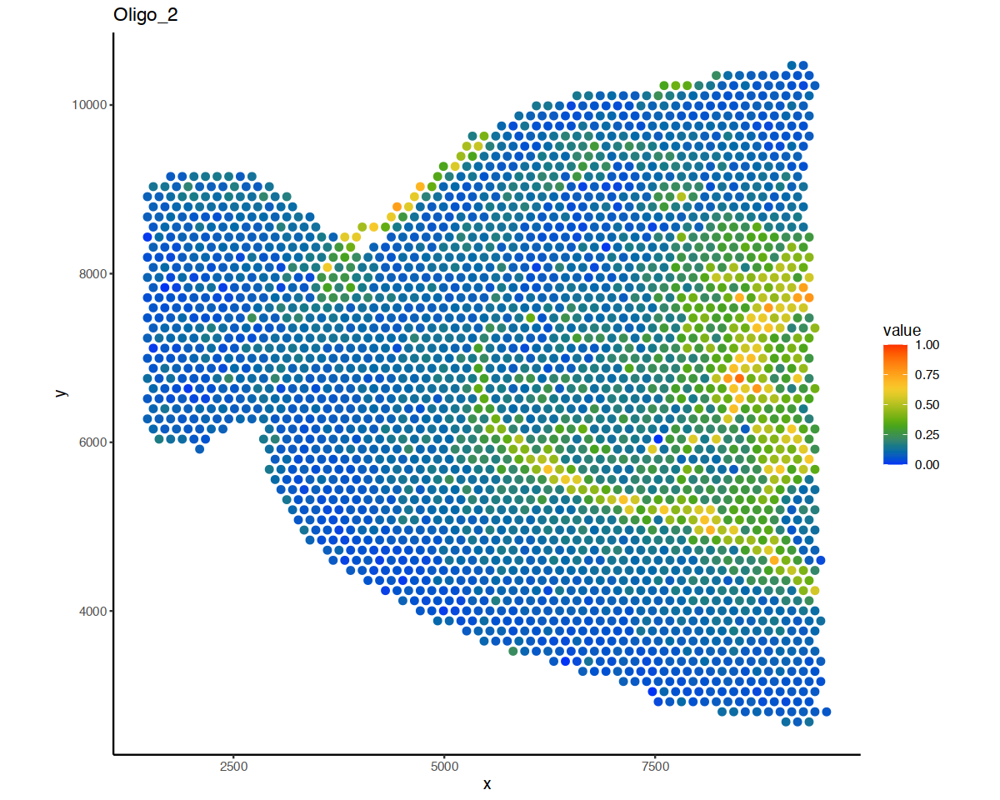

In [62]:
plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,cell_type_names[7]], title =cell_type_names[7], size=2)

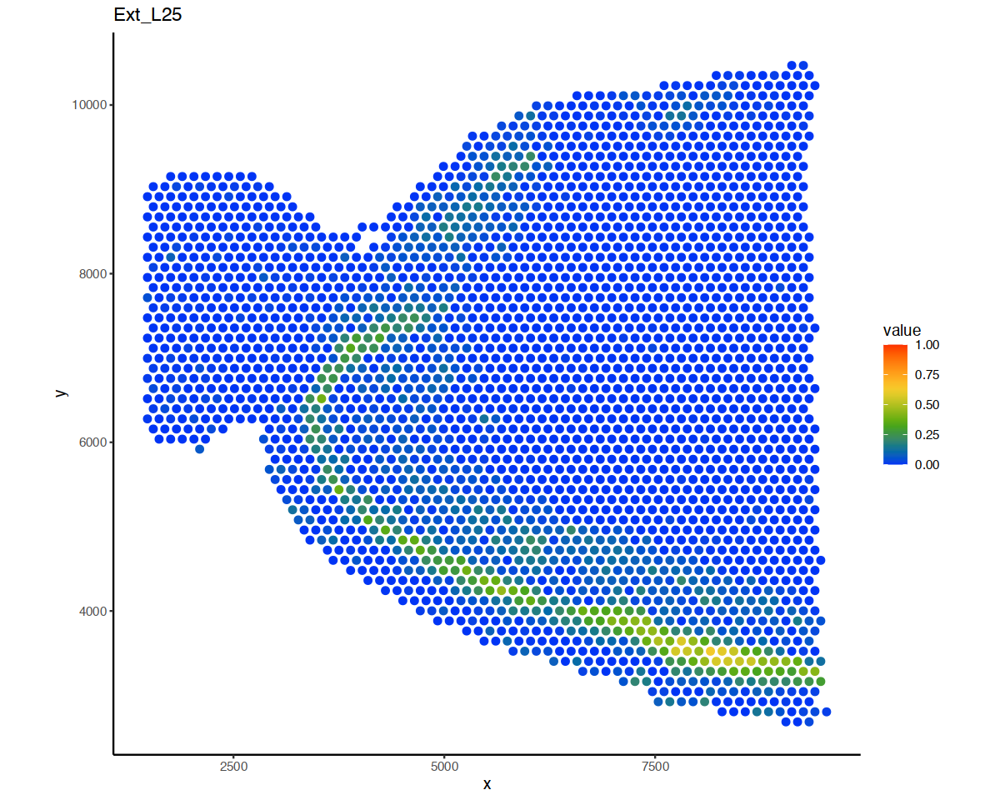

In [21]:
plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,cell_type_names[1]], title =cell_type_names[1], size=2)

In [22]:
dir.create('data/result/RCTD/')

for(i in 1:length(cell_type_names)){
  plot_puck_continuous(myRCTD@spatialRNA, barcodes, normalized_weights[,cell_type_names[i]], title =cell_type_names[i], size=1)
  ggsave(paste0('data/result/RCTD/', cell_type_names[i], '_weights.png'), height=5, width=5, units='in', dpi=300)
}

Warning message in dir.create("data/result/RCTD/"):
“'data/result/RCTD' already exists”


ERROR: Error in ggsave(paste0("data/result/RCTD/", cell_type_names[i], "_weights.png"), : could not find function "ggsave"


In [71]:
library(STdeconvolve)

anterior1@images$anterior1

m <- as.matrix(normalized_weights)
coords <- anterior1@images$anterior1@coordinates[, c("imagecol","imagerow")]
colnames(coords) <- c('x', 'y')

Spatial data from the VisiumV1 technology for 2696 samples
Associated assay: Spatial 
Image key: anterior1_ 

In [72]:

plt <- vizAllTopics(theta = m,
             pos = coords,
             topicOrder=seq(ncol(m)),
             topicCols=rainbow(ncol(m)),
             groups = NA,
             group_cols = NA,
             r = 56,
             lwd = 0.3,
             showLegend = TRUE,
             plotTitle = "scatterpies")

plt <- plt + ggplot2::guides(fill=ggplot2::guide_legend(ncol=2))


Plotting scatterpies for 2696 pixels with 37 cell-types...this could take a while if the dataset is large.




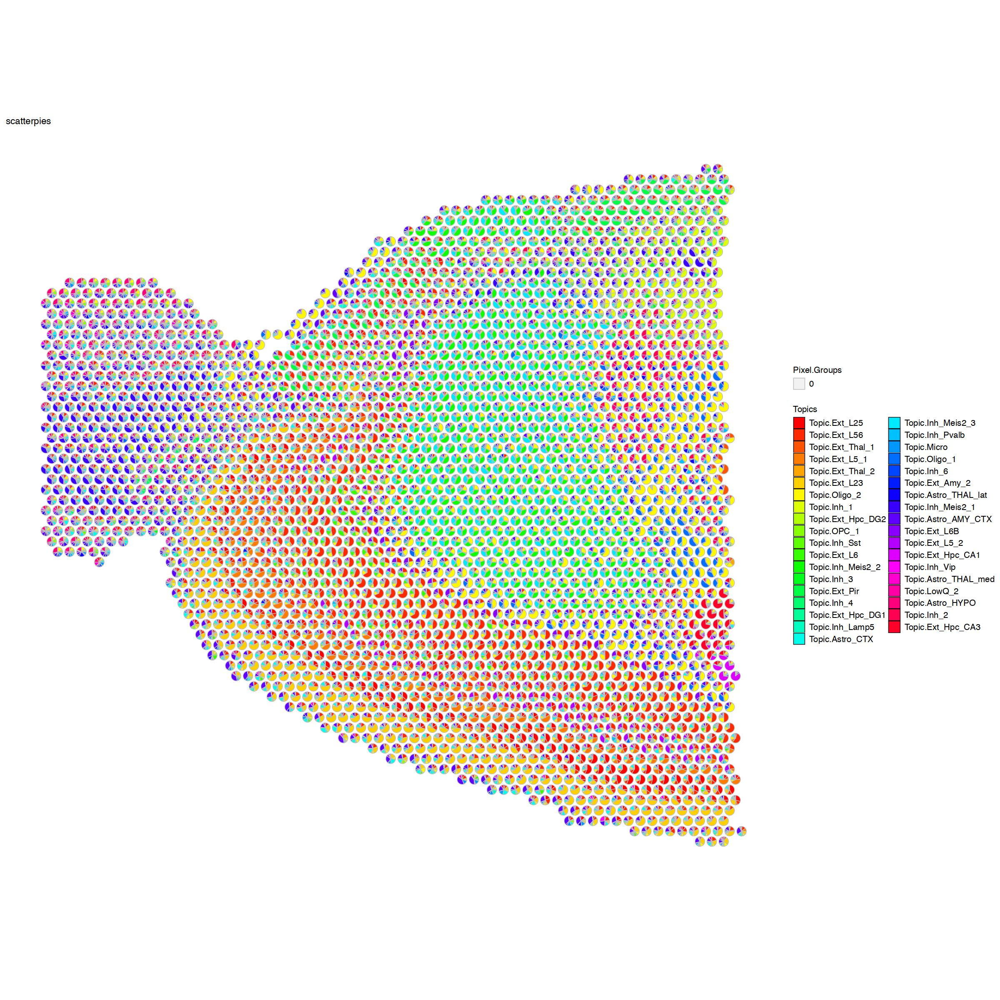

In [73]:
options(repr.plot.width=20, repr.plot.height=20)
plt

## BayesSpace

In [76]:
library(SingleCellExperiment)
library(BayesSpace, verbose=F)

In [77]:
#BaysesSpace的输入要求是SingleCellExperiment对象
bays_anterior1 <- as.SingleCellExperiment(anterior1)

In [78]:
bays_anterior1 <- scater::logNormCounts(bays_anterior1)

In [79]:
#Seurat对象转换为SingleCellExperiment对象后，做部分调整，才能正常运行BayesSpace
bays_anterior1@colData@listData$in_tissue = anterior1@images$anterior1@coordinates$tissue
bays_anterior1@colData@listData$row <- anterior1@images$anterior1@coordinates$row
bays_anterior1@colData@listData$col <- anterior1@images$anterior1@coordinates$col
bays_anterior1@colData@listData$imagerow <- anterior1@images$anterior1@coordinates$imagerow
bays_anterior1@colData@listData$imagecol <- anterior1@images$anterior1@coordinates$imagecol
bays_anterior1@colData@listData$spot <- rownames(as.data.frame(bays_anterior1@colData@listData$sizeFactor))

In [81]:
#数据预处理
bays_anterior1 <- spatialPreprocess(bays_anterior1, platform="Visium",
                                    n.PCs=15, n.HVGs=2000, log.normalize=F)

In [82]:
##选择cluster数目
bays_anterior1 <- qTune(bays_anterior1, qs=seq(8, 13), platform="Visium")

Neighbors were identified for 2696 out of 2696 spots.

Fitting model...

Fitting model...

Fitting model...

Fitting model...

Fitting model...

Fitting model...



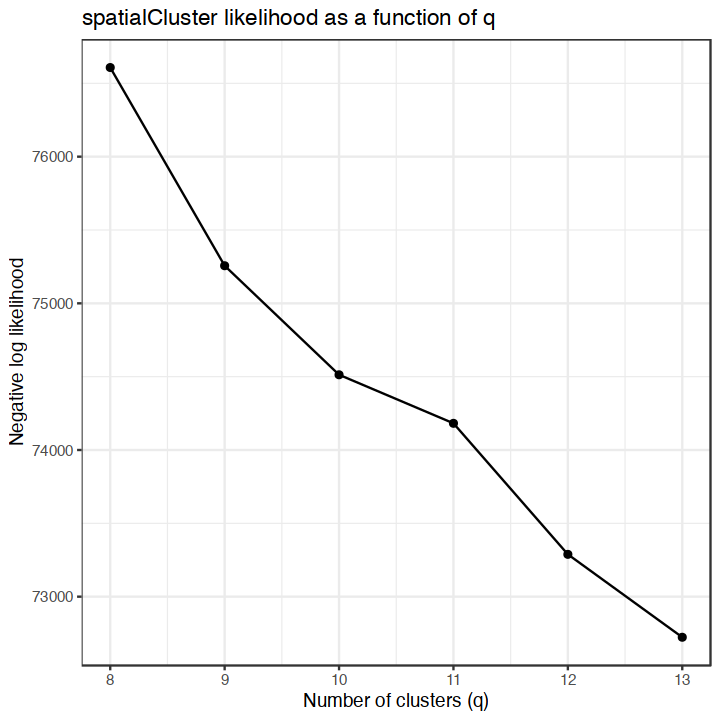

In [84]:
options(repr.plot.width=6, repr.plot.height=6)
qPlot(bays_anterior1)

In [85]:
#聚类
bays_anterior1 <- spatialCluster(bays_anterior1, q=9, platform="Visium",
                           init.method="mclust", model="t", gamma=2,
                           nrep=1000, burn.in=100,
                           save.chain=TRUE)

Neighbors were identified for 2696 out of 2696 spots.

Fitting model...

You created a large dataset with compression and chunking.
The chunk size is equal to the dataset dimensions.
If you want to read subsets of the dataset, you should testsmaller chunk sizes to improve read times.

You created a large dataset with compression and chunking.
The chunk size is equal to the dataset dimensions.
If you want to read subsets of the dataset, you should testsmaller chunk sizes to improve read times.

Calculating labels using iterations 100 through 1000.



In [86]:
bays_anterior1

class: SingleCellExperiment 
dim: 31053 2696 
metadata(2): BayesSpace.data chain.h5
assays(2): counts logcounts
rownames(31053): Xkr4 Gm1992 ... Vmn2r122 CAAA01147332.1
rowData names(1): is.HVG
colnames(2696): AAACAAGTATCTCCCA-1 AAACACCAATAACTGC-1 ...
  TTGTTTCACATCCAGG-1 TTGTTTCCATACAACT-1
colData names(15): orig.ident nCount_Spatial ... cluster.init
  spatial.cluster
reducedDimNames(1): PCA
mainExpName: Spatial
altExpNames(0):

In [96]:
options(repr.plot.width=10, repr.plot.height=10)
p2 <- clusterPlot(bays_anterior1)

In [93]:
#我们用Seurat的方法重新聚类，比较一下
antnew <- FindClusters(anterior1, resolution = 0.4, verbose=F)

In [92]:
anterior1 <- readRDS('data/stxBrain/withMarker_anterior1.rds')

In [95]:
p1 <- SpatialDimPlot(antnew)

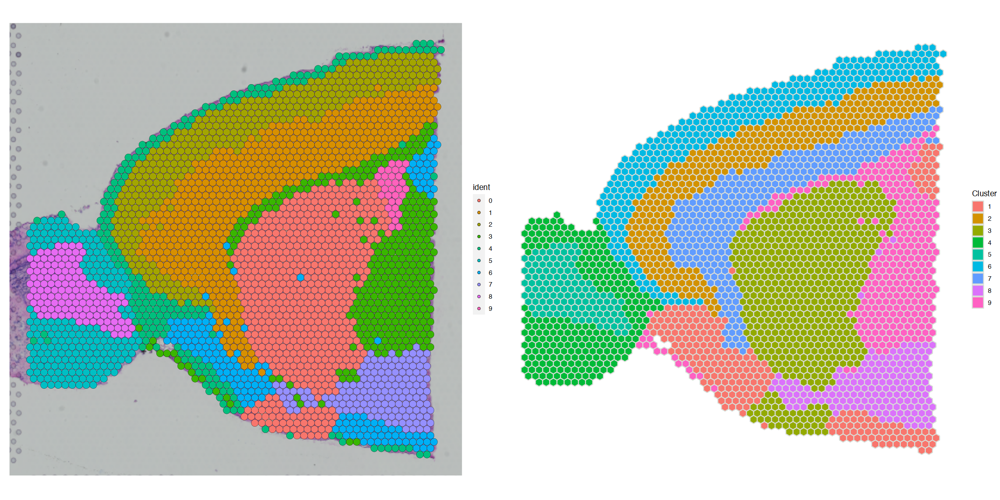

In [98]:
options(repr.plot.width=20, repr.plot.height=10)
p1 + p2

In [99]:
bays_anterior1.enhanced <- spatialEnhance(bays_anterior1, q=9, platform="Visium",
                                    model="t", gamma=2,
                                    jitter_prior=0.3, jitter_scale=3.5,
                                    nrep=1000, burn.in=100,
                                    save.chain=TRUE)

In [ ]:
#saveRDS(bays_anterior1.enhanced, 'data/result/BayesSpaces_bays_anterior1_enhanced.rds')

In [112]:
bays_anterior1.enhanced <- readRDS('data/result/BayesSpaces_bays_anterior1_enhanced.rds')

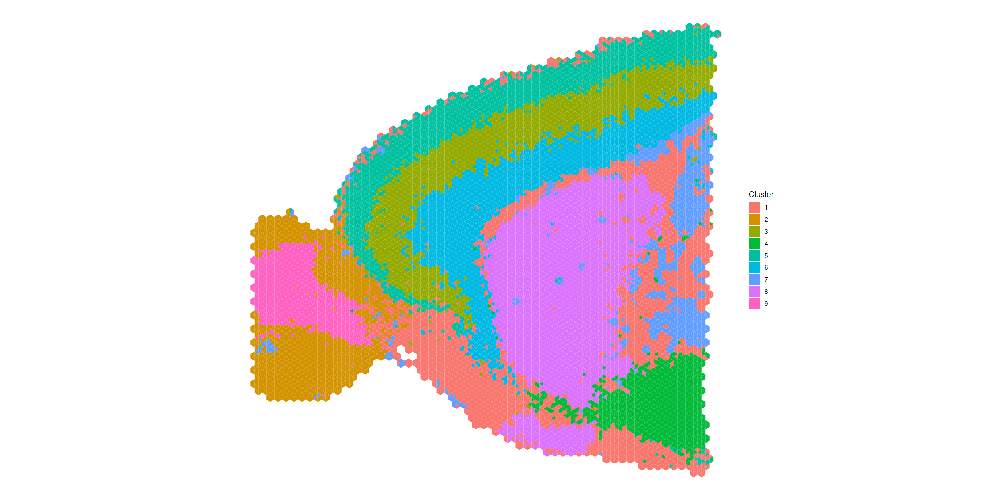

In [101]:
clusterPlot(bays_anterior1.enhanced)

In [103]:
bays_anterior1.enhanced

class: SingleCellExperiment 
dim: 17668 16176 
metadata(2): chain.h5 BayesSpace.data
assays(1): logcounts
rownames(17668): Xkr4 Sox17 ... CAAA01118383.1 CAAA01147332.1
rowData names(2): is.HVG enhanceFeatures.rmse
colnames(16176): subspot_1.1 subspot_2.1 ... subspot_2695.6
  subspot_2696.6
colData names(9): spot.idx subspot.idx ... imagecol spatial.cluster
reducedDimNames(1): PCA
mainExpName: NULL
altExpNames(0):

In [104]:
mm <- colData(bays_anterior1.enhanced)

In [105]:
head(mm)

DataFrame with 6 rows and 9 columns
             spot.idx subspot.idx  spot.row  spot.col       row        col
            <numeric>   <integer> <integer> <integer> <numeric>  <numeric>
subspot_1.1         1           1        50       102   50.3333 102.333333
subspot_2.1         2           1        59        19   59.3333  19.333333
subspot_3.1         3           1        14        94   14.3333  94.333333
subspot_4.1         4           1        43         9   43.3333   9.333333
subspot_5.1         5           1        47        13   47.3333  13.333333
subspot_6.1         6           1        62         0   62.3333   0.333333
             imagerow  imagecol spatial.cluster
            <numeric> <numeric>       <numeric>
subspot_1.1   7514.92   8523.94               1
subspot_2.1   8592.92   2810.94               2
subspot_3.1   3203.92   7972.94               5
subspot_4.1   6676.92   2121.94               9
subspot_5.1   7155.92   2397.94               9
subspot_6.1   8952.92   1502

In [106]:
mm[grep('subspot_1[.]', rownames(mm)), ]

DataFrame with 6 rows and 9 columns
             spot.idx subspot.idx  spot.row  spot.col       row       col
            <numeric>   <integer> <integer> <integer> <numeric> <numeric>
subspot_1.1         1           1        50       102   50.3333   102.333
subspot_1.2         1           2        50       102   50.3333   101.667
subspot_1.3         1           3        50       102   49.6667   102.333
subspot_1.4         1           4        50       102   49.6667   101.667
subspot_1.5         1           5        50       102   50.0000   102.667
subspot_1.6         1           6        50       102   50.0000   101.333
             imagerow  imagecol spatial.cluster
            <numeric> <numeric>       <numeric>
subspot_1.1   7514.92   8523.94               1
subspot_1.2   7514.92   8478.06               1
subspot_1.3   7435.08   8523.94               1
subspot_1.4   7435.08   8478.06               1
subspot_1.5   7475.00   8546.89               1
subspot_1.6   7475.00   8455.11     

In [107]:
head(anterior1@images$anterior1@coordinates)

,tissue,row,col,imagerow,imagecol
,<int>,<int>,<int>,<int>,<int>
AAACAAGTATCTCCCA-1,1,50,102,7475,8501
AAACACCAATAACTGC-1,1,59,19,8553,2788
AAACAGAGCGACTCCT-1,1,14,94,3164,7950
AAACAGCTTTCAGAAG-1,1,43,9,6637,2099
AAACAGGGTCTATATT-1,1,47,13,7116,2375
AAACATGGTGAGAGGA-1,1,62,0,8913,1480


In [109]:
genes <- c('Gfap', 'Cux2', 'Tbr1', 'Fezf2')

In [114]:
bays_anterior1.enhanced <- enhanceFeatures(bays_anterior1.enhanced, bays_anterior1,
                                 feature_names=genes,
                                 nrounds=0)

ERROR: Error in `assays<-`(`*tmp*`, withDimnames = withDimnames, ..., value = `*vtmp*`): please use 'assay(x, withDimnames=FALSE)) <- value' or 'assays(x,
  withDimnames=FALSE)) <- value' when the rownames or colnames of the
  supplied assay(s) are not identical to those of the receiving
  SingleCellExperiment object 'x'


In [ ]:
p1 <- purrr::map(genes, function(x) featurePlot(bays_anterior1.enhanced, x))
p2 <- purrr::map(genes, function(x) featurePlot(bays_anterior1, x))

In [ ]:
p1[[2]]+p2[[2]]

In [ ]:
p1[[4]]+p2[[4]]

## GSVA

<img src="data/figure/GSVA.jpeg" style="width:80%;position:relative;left:10%" alt='IMG'>

1. 累积密度函数核估计(kcdf): 这两个图显示了两个模拟的表达谱，模拟了来自微阵列和 RNA-seq 数据的 6 个样本。 x 轴对应于表达值，g1基因为例，在四个样本中低表达，而在其他两个样本中高表达。 kcdf 的值在左侧 y 轴上，高斯和泊松核的值在右侧 y 轴上
2. 每个样本根据累计密度值对基因进行排序。
3. 对每个基因集，计算类似KS检验的统计量（类比于KS检验的经验累计密度分布与理论累计密度分布，以图中为例就是红色线的长度减去蓝色线的长度）。
4. 最后的输出矩阵每一行代表了一个基因集，每一列代表了一个样本

下面的公式分别代表了假设基因表达服从正态分布和泊松分布时的累计密度估计，用通俗的语言来描述一下：假设有6个样本，对于基因A，分别以每个样本的表达值为均值的分布（也就是6个分布），计算每个样本的A基因在这6个分布的累计概率，并计算平均值，得到的每个样本的平均值就作为排序的依据。

$$
F_{h_i} = \frac{1}{n}\sum\limits_{k=1}^{n}\int_{-\infty}^{\frac{x_{ij}-x_{ik}}{h_i}}\frac{1}{\sqrt{2\Pi}}e^{-\frac{t^2}{2}}\text dt
$$

$$
F_{r} = \frac{1}{n}\sum\limits_{k=1}^n\sum\limits_{y=0}^{x_{ij}}\frac{e^{-(x_{ik}+r)}(x_{ik}+r)^y}{y!}
$$

In [6]:
library(GSVA)
library(org.Mm.eg.db)
library(msigdbr)
library(Seurat)

Attaching SeuratObject

Attaching sp



In [3]:
c2Genes <- msigdbr('Mus musculus', category = 'C2')

In [4]:
anterior1 <- readRDS('data/stxBrain/withMarker_anterior1.rds')

In [7]:
exprdata <- GetAssayData(anterior1, assay = 'Spatial', slot='data')

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



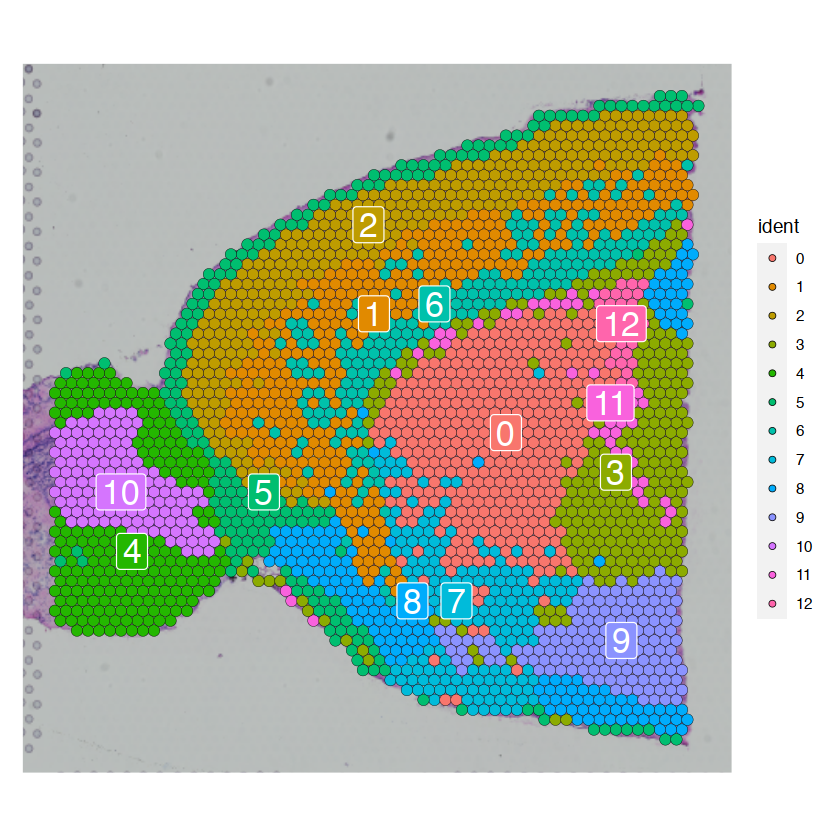

In [8]:
SpatialDimPlot(anterior1, label=T)

In [9]:
brain_pathway <- c('LEIN_LOCALIZED_TO_DISTAL_AND_PROXIMAL_DENDRITES',
                   'LEIN_MEDULLA_MARKERS',
                   'LEIN_MIDBRAIN_MARKERS',
                   'LEIN_OLIGODENDROCYTE_MARKERS',
                   'LEIN_PONS_MARKERS',
                   'PID_ALPHA_SYNUCLEIN_PATHWAY',
                   'LEIN_NEURON_MARKERS',
                   'LEIN_ASTROCYTE_MARKERS',
                   'KEGG_NEUROACTIVE_LIGAND_RECEPTOR_INTERACTION',
                   'REACTOME_NEURONAL_SYSTEM')

In [10]:
genesets <- c2Genes[c2Genes$gs_name %in% brain_pathway,]

In [11]:
genesets <- split(genesets$gene_symbol, genesets$gs_name)

In [ ]:
#brain_gsva_res <- gsva(exprdata, genesets , method='gsva')

Warning message in .local(expr, gset.idx.list, ...):
“Using 'dgCMatrix' objects as input is still in an experimental stage.”
Warning message in .filterFeatures(expr, method):
“10586 genes with constant expression values throuhgout the samples.”
Warning message in .filterFeatures(expr, method):
“Since argument method!="ssgsea", genes with constant expression values are discarded.”


In [12]:
#saveRDS(brain_gsva_res, 'data/result/GSVA_result.rds')
brain_gsva_res <- readRDS('data/result/GSVA_result.rds')

In [13]:
anterior1@meta.data[, brain_pathway] <- t(brain_gsva_res)

In [14]:
brain_pathway

[1] "LEIN_LOCALIZED_TO_DISTAL_AND_PROXIMAL_DENDRITES"
 [2] "LEIN_MEDULLA_MARKERS"                           
 [3] "LEIN_MIDBRAIN_MARKERS"                          
 [4] "LEIN_OLIGODENDROCYTE_MARKERS"                   
 [5] "LEIN_PONS_MARKERS"                              
 [6] "PID_ALPHA_SYNUCLEIN_PATHWAY"                    
 [7] "LEIN_NEURON_MARKERS"                            
 [8] "LEIN_ASTROCYTE_MARKERS"                         
 [9] "KEGG_NEUROACTIVE_LIGAND_RECEPTOR_INTERACTION"   
[10] "REACTOME_NEURONAL_SYSTEM"

In [17]:
library(ggplot2)

In [26]:
p1 <- SpatialDimPlot(anterior1, label=T)

p2 <- SpatialFeaturePlot(anterior1, 'REACTOME_NEURONAL_SYSTEM')

p3 <- ggplot(anterior1@meta.data, aes(x=seurat_clusters, y=REACTOME_NEURONAL_SYSTEM, fill=seurat_clusters)) +
      geom_boxplot(notch = T, width=0.5, outlier.color = NA)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



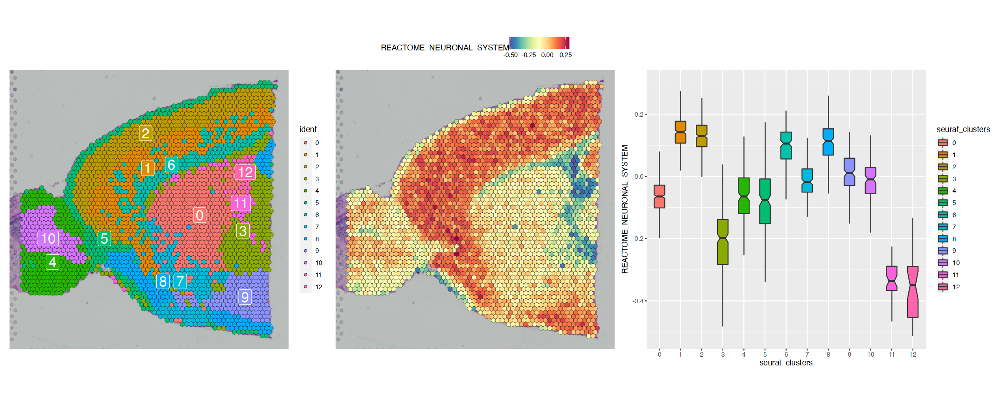

In [27]:
options(repr.plot.width=20, repr.plot.height=8)
p1+p2+p3

In [28]:
genes <- readLines('genes.txt')

In [39]:
length(genes)

[1] 52

In [37]:
genes2 <- intersect(genes, rownames(exprdata))

In [41]:
tmp <-  gsva(exprdata, list(genes2) , method='gsva')

Warning message in .local(expr, gset.idx.list, ...):
“Using 'dgCMatrix' objects as input is still in an experimental stage.”
Warning message in .filterFeatures(expr, method):
“10586 genes with constant expression values throuhgout the samples.”
Warning message in .filterFeatures(expr, method):
“Since argument method!="ssgsea", genes with constant expression values are discarded.”


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



In [44]:
anterior1@meta.data[, 'newnew'] <- t(tmp)

In [45]:
p1 <- SpatialDimPlot(anterior1, label=T)

p2 <- SpatialFeaturePlot(anterior1, 'newnew')

p3 <- ggplot(anterior1@meta.data, aes(x=seurat_clusters, y=newnew, fill=seurat_clusters)) +
      geom_boxplot(notch = T, width=0.5, outlier.color = NA)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



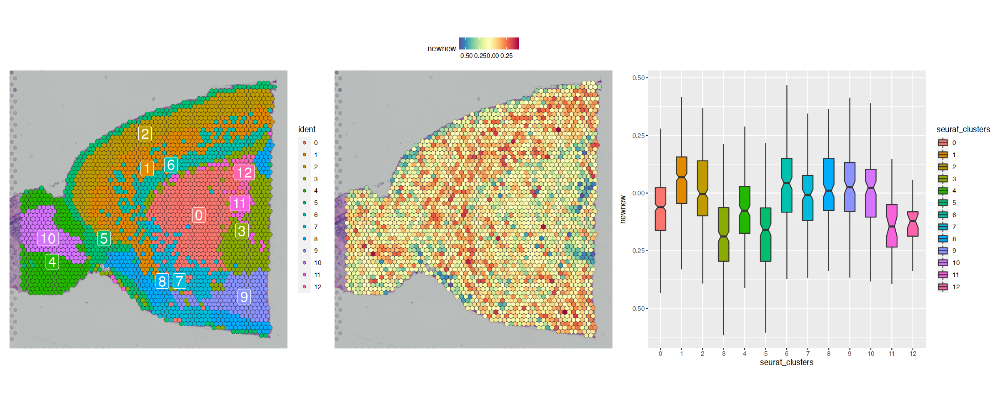

In [46]:
p1+p2+p3

这里实际上在单细胞数据分析上用的比较多，比如给一个基因集，看一下不同细胞之间或者不同类群之间的差异，也可以用ES得分进行t检验，检验不同类群之间的差异等，另外的像AUCell也是很长用的。

#### KEGG富集分析

文件的下载方法可以参考这里：https://www.kegg.jp/kegg/rest/keggapi.html, 比如后面用的文件下载地址：  
pathway的描述文件mmu.pathway2description.txt：https://rest.kegg.jp/list/pathway/mmu  
pathway包含的基因文件mmu.hsaID2pathID.txt：https://rest.kegg.jp/link/pathway/mmu  
这么做的好处是准确性和实效性都有保证。

In [42]:
library(clusterProfiler, verbose=F)
library(org.Mm.eg.db, verbose=F)



clusterProfiler v4.4.4  For help: https://yulab-smu.top/biomedical-knowledge-mining-book/

If you use clusterProfiler in published research, please cite:
T Wu, E Hu, S Xu, M Chen, P Guo, Z Dai, T Feng, L Zhou, W Tang, L Zhan, X Fu, S Liu, X Bo, and G Yu. clusterProfiler 4.0: A universal enrichment tool for interpreting omics data. The Innovation. 2021, 2(3):100141


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:AnnotationDbi’:

    select


The following object is masked from ‘package:IRanges’:

    slice


The following object is masked from ‘package:S4Vectors’:

    rename


The following object is masked from ‘package:stats’:

    filter




In [ ]:
columns(org.Mm.eg.db)

In [ ]:
kegg <- read.table('data/KEGG/mmu.hsaID2pathID.txt', col.names = c('entrzid', 'pathway'))

head(kegg)

keggdesc <- read.table('data/KEGG/mmu.pathway2description.txt', sep='\t', col.names = c('pathway', 'description'))

head(keggdesc)

keggdkeggdescscription <- gsub(' - Mus musculus \\(house mouse\\)', '', keggdesc$description)

kegg$entrzid <- gsub('mmu:', '', kegg$entrzid, )
kegg$pathway <- gsub('path:', '', kegg$pathway, )
kegg <- kegg[, c(2,1)]

genes <- subset(anterior1@misc$marker0.8_all, cluster==2 & avg_log2FC >=0.5)$gene

genesid <- AnnotationDbi::select(org.Mm.eg.db, keys=genes, columns=c('ENTREZID', 'GENENAME', 'ENSEMBL'), keytype = 'SYMBOL')

enkegg <- enricher(genesid$ENTREZID, TERM2GENE = kegg, TERM2NAME = keggdesc)

head(enkegg@result[, c(1,2,5,6,9)])

options(repr.plot.width=8, repr.plot.height=6)
dotplot(enkegg, showCategory = 10, orderBy='x')